<a href="https://colab.research.google.com/github/shrayashp/VLG_Project_TransferLearning/blob/main/vlg_project_transfer_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup


In [1]:
import tensorflow as tf
print(tf.__version__)

2.5.0


In [2]:
!pip install tensorflow-gpu

In [3]:
import os
import pathlib


if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

In [4]:
cd /content/drive/MyDrive/TensorFlow/models/research

/content/drive/MyDrive/TensorFlow/models/research


In [5]:
pwd

'/content/drive/My Drive/TensorFlow/models/research'

In [6]:
!protoc object_detection/protos/*.proto --python_out=.

In [7]:
!git clone https://github.com/cocodataset/cocoapi.git

Cloning into 'cocoapi'...
remote: Enumerating objects: 975, done.
remote: Total 975 (delta 0), reused 0 (delta 0), pack-reused 975
Receiving objects: 100% (975/975), 11.72 MiB | 12.81 MiB/s, done.
Resolving deltas: 100% (576/576), done.


In [8]:
cd cocoapi/PythonAPI

/content/drive/MyDrive/TensorFlow/models/research/cocoapi/PythonAPI


In [17]:
cp -r pycocotools /content/drive/MyDrive/TensorFlow/models/research

In [7]:
!pip install pycocotools

Compile protobufs

In [18]:
%%bash
cd /content/drive/MyDrive/TensorFlow/models/research
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/drive/My Drive/TensorFlow/models/research
  Created wheel for object-detection: filename=object_detection-0.1-cp37-none-any.whl size=1643824 sha256=79181446b5bdd7641cb7e97d96b1d546921e377afcde34229bc7c86a8db66049
  Stored in directory: /tmp/pip-ephem-wheel-cache-8eklmcwc/wheels/7e/9f/da/d441da9f997686acdc68e780fc547a242c96f158a27d77b8d7
  Created wheel for avro-python3: filename=avro_python3-1.10.2-cp37-none-any.whl size=44011 sha256=b6082e87a5a03f923df39b75cc450af217f314b49b2b1dbc1c6e0600a222609f
  Stored in directory: /root/.cache/pip/wheels/ee/ee/18/c466221ca6900e3efce2f4ea9c329288808679aecdcb2838d3
  Created wheel for dill: filename=dill-0.3.1.1-cp37-none-any.whl size=78532 sha256=ddf48a19b0a5320c7be92bb30576095584ea561d62be92412ce2cc9b44464053
  Stored in directory: /root/.cache/pip/wheels/59/b1/91/f02e76c732915c4015ab4010f3015469866c1eb9b14058d8e7
  Created wheel for future: filename=future-0.18.2-cp37-none-any.whl size=491058 sha256=bc65ef8cbca2dfc46ab4c2e9ab

ERROR: multiprocess 0.70.11.1 has requirement dill>=0.3.3, but you'll have dill 0.3.1.1 which is incompatible.
ERROR: google-colab 1.0.0 has requirement requests~=2.23.0, but you'll have requests 2.25.1 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
ERROR: apache-beam 2.29.0 has requirement avro-python3!=1.9.2,<1.10.0,>=1.8.1, but you'll have avro-python3 1.10.2 which is incompatible.


In [22]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile
import _pickle as cPickle
import cv2

from collections import defaultdict
from io import StringIO
from six import BytesIO
from matplotlib import pyplot as plt
from pathlib import Path
from PIL import Image
from IPython.display import display
%matplotlib inline

In [21]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [23]:
!python /content/drive/MyDrive/TensorFlow/models/research/object_detection/builders/model_builder_tf2_test.py 

2021-05-31 07:20:31.942760: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
Running tests under Python 3.7.10: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model
2021-05-31 07:20:33.954398: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-05-31 07:20:33.981853: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-05-31 07:20:33.982432: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMemoryBandwidth: 298.08GiB/s
2021-05-31 07:20:33.982475: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully 

In [24]:
from object_detection.utils import colab_utils
from object_detection.utils import visualization_utils as viz_utils

# Model Preparation


In [25]:
cd /content/drive/MyDrive/TensorFlow/scripts/preprocessing

/content/drive/MyDrive/TensorFlow/scripts/preprocessing


In [26]:
# Create train data:
!python generate_tfrecord.py -x /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/train -l /content/drive/MyDrive/TensorFlow/workspace/training_demo/annotations/label_map.pbtxt -o /content/drive/MyDrive/TensorFlow/workspace/training_demo/annotations/train.record

# Create test data:
!python generate_tfrecord.py -x /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test -l /content/drive/MyDrive/TensorFlow/workspace/training_demo/annotations/label_map.pbtxt -o /content/drive/MyDrive/TensorFlow/workspace/training_demo/annotations/test.record


Successfully created the TFRecord file: /content/drive/MyDrive/TensorFlow/workspace/training_demo/annotations/train.record
Successfully created the TFRecord file: /content/drive/MyDrive/TensorFlow/workspace/training_demo/annotations/test.record


In [27]:
cd /content/drive/MyDrive/TensorFlow/workspace/training_demo

/content/drive/MyDrive/TensorFlow/workspace/training_demo


In [28]:
pwd


'/content/drive/MyDrive/TensorFlow/workspace/training_demo'

In [29]:
ls


annotations/      exporter_main_v2.py  model_main_tf2.py  pre-trained-models/
exported-models/  images/              models/


In [31]:
!python model_main_tf2.py --model_dir=models/my_ssd_resnet50_v1_fpn --pipeline_config_path=/content/drive/MyDrive/TensorFlow/workspace/training_demo/models/pipeline.config

2021-05-31 07:37:07.586385: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-05-31 07:37:09.716055: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-05-31 07:37:09.746158: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-05-31 07:37:09.746759: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMemoryBandwidth: 298.08GiB/s
2021-05-31 07:37:09.746804: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-05-31 07:37:09.750865: I tensorflow/stream_executor/platform/default

In [ ]:
pwd


'/content/drive/My Drive/TensorFlow/workspace/training_demo'

In [ ]:
mkdir exported-models

mkdir: cannot create directory ‘exported-models’: File exists


In [ ]:
cd /content/drive/MyDrive/TensorFlow/workspace/training_demo/exported-models

/content/drive/MyDrive/TensorFlow/workspace/training_demo/exported-models


In [ ]:
mkdir my_model 

In [ ]:
cd ..

/content/drive/MyDrive/TensorFlow/workspace/training_demo


In [ ]:
pwd

'/content/drive/My Drive/TensorFlow/workspace/training_demo'

In [ ]:
!python exporter_main_v2.py --input_type image_tensor --pipeline_config_path /content/drive/MyDrive/TensorFlow/workspace/training_demo/models/pipeline.config --trained_checkpoint_dir /content/drive/MyDrive/TensorFlow/workspace/training_demo/models/my_ssd_resnet50_v1_fpn --output_directory /content/drive/MyDrive/TensorFlow/workspace/training_demo/exported-models/my_model

2021-05-28 09:16:30.875281: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-05-28 09:16:33.925976: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-05-28 09:16:33.946905: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-05-28 09:16:33.947773: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla K80 computeCapability: 3.7
coreClock: 0.8235GHz coreCount: 13 deviceMemorySize: 11.17GiB deviceMemoryBandwidth: 223.96GiB/s
2021-05-28 09:16:33.947820: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-05-28 09:16:33.957731: I tensorflow/stream_executor/platform/defa

In [ ]:
pwd

'/content/drive/My Drive/TensorFlow/workspace/training_demo'

In [ ]:
PATH_TO_LABELS =  '/content/drive/MyDrive/TensorFlow/workspace/training_demo/annotations/label_map.pbtxt'
IMAGE_PATH=[]
path='/content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/'
for file in os.listdir(path):
    if file.endswith(".jpg"):
       IMAGE_PATH.append(path+file)
IMAGE_PATH[0]

'/content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out21.jpg'

In [ ]:
import time
from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder

PATH_TO_MODEL_DIR='/content/drive/MyDrive/TensorFlow/workspace/training_demo/exported-models/my_model'

PATH_TO_CFG = PATH_TO_MODEL_DIR + "/pipeline.config"
PATH_TO_CKPT = PATH_TO_MODEL_DIR + "/checkpoint"

print('Loading model... ', end='')
start_time = time.time()

# Load pipeline config and build a detection model
configs = config_util.get_configs_from_pipeline_file(PATH_TO_CFG)
model_config = configs['model']
detection_model = model_builder.build(model_config=model_config, is_training=False)

# Restore checkpoint
ckpt = tf.compat.v2.train.Checkpoint(model=detection_model)
ckpt.restore(os.path.join(PATH_TO_CKPT, 'ckpt-0')).expect_partial()

@tf.function
def detect_fn(image):
    """Detect objects in image."""

    image, shapes = detection_model.preprocess(image)
    prediction_dict = detection_model.predict(image, shapes)
    detections = detection_model.postprocess(prediction_dict, shapes)

    return detections

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

Loading model... Done! Took 0.05042839050292969 seconds


In [ ]:
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS,
                                                                    use_display_name=True)

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out21.jpg... Done


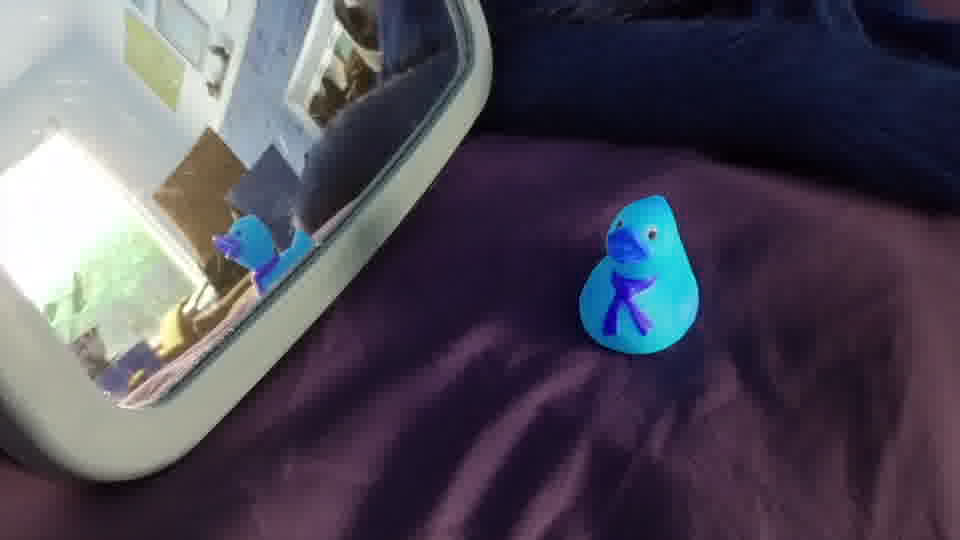

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out10.jpg... Done


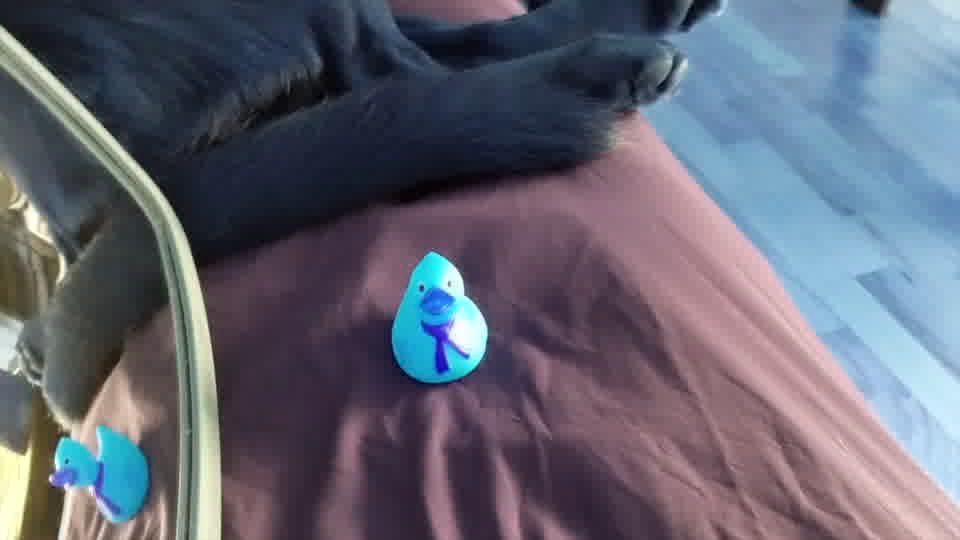

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out19.jpg... Done


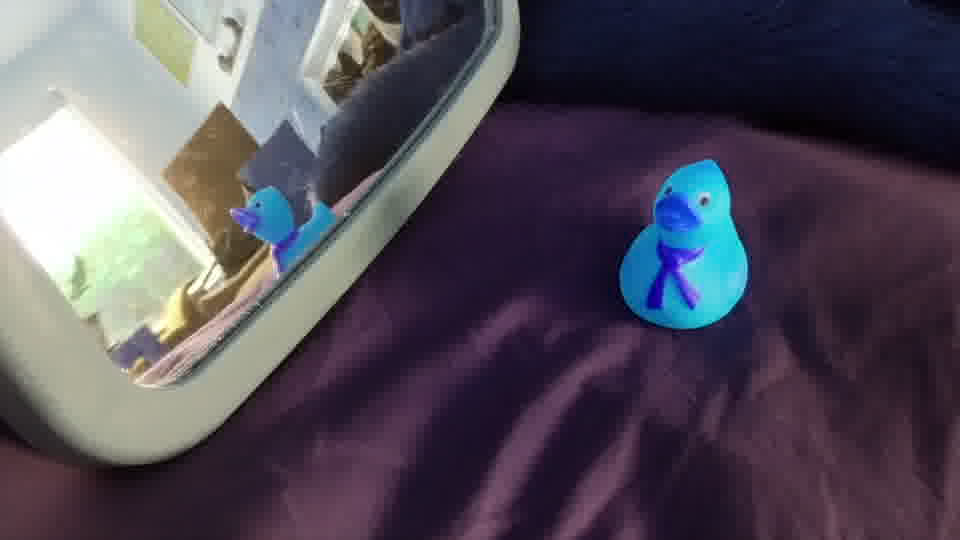

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out18.jpg... Done


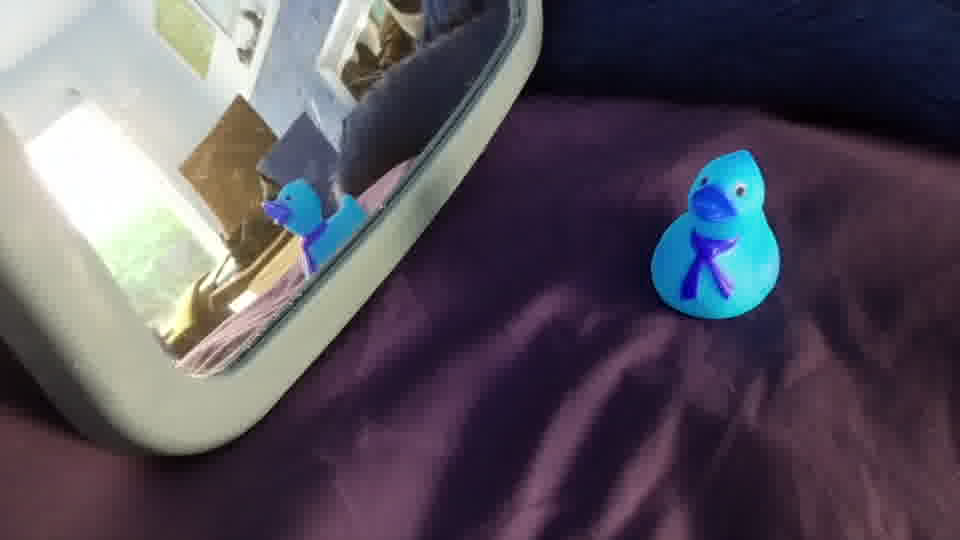

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out2.jpg... Done


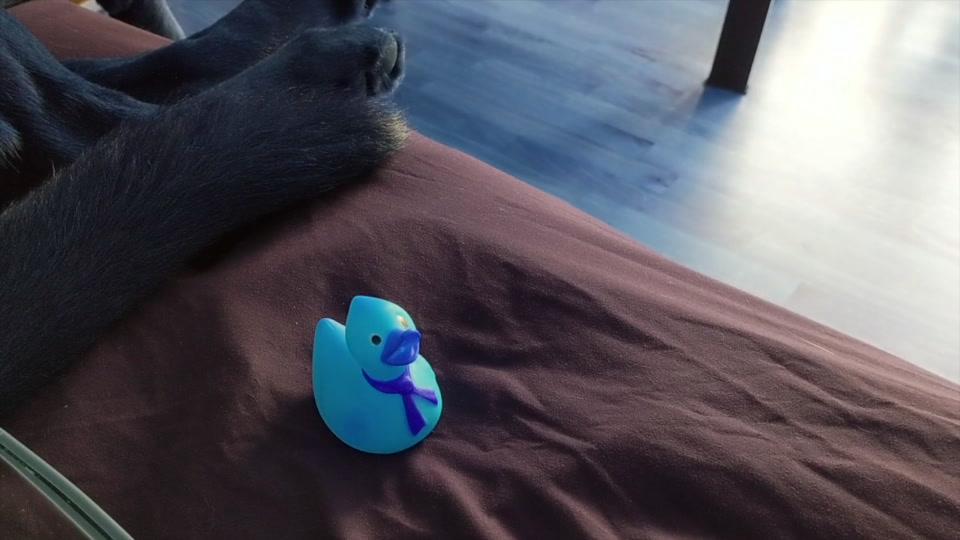

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out15.jpg... Done


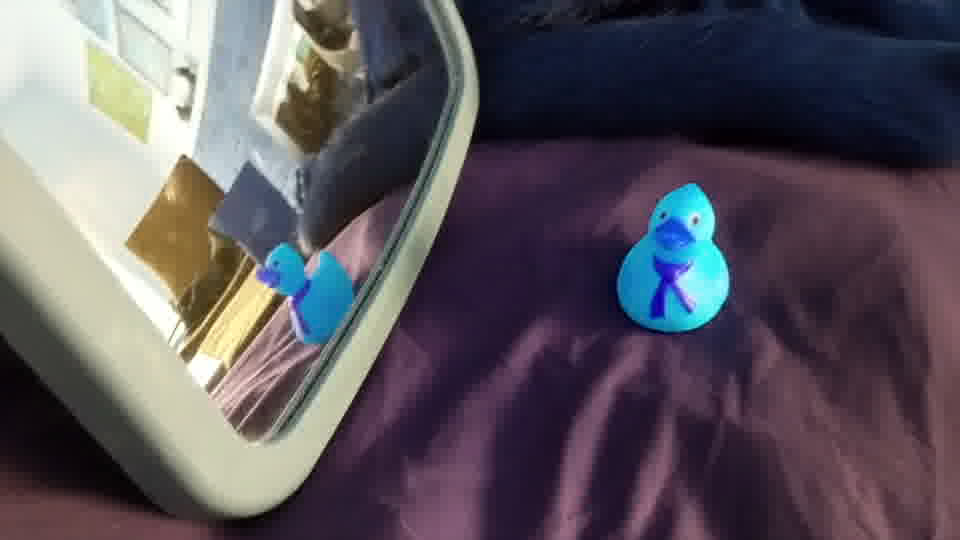

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out26.jpg... Done


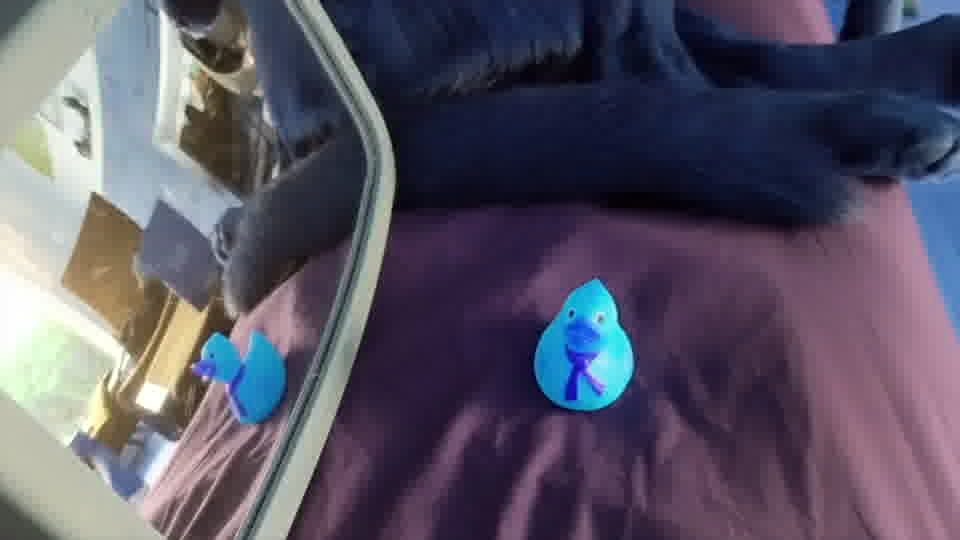

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out16.jpg... Done


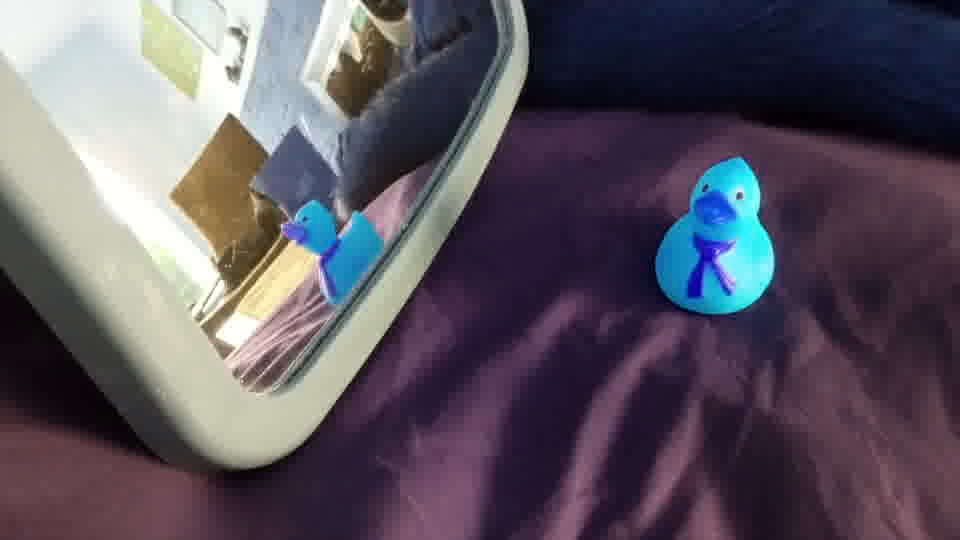

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out11.jpg... Done


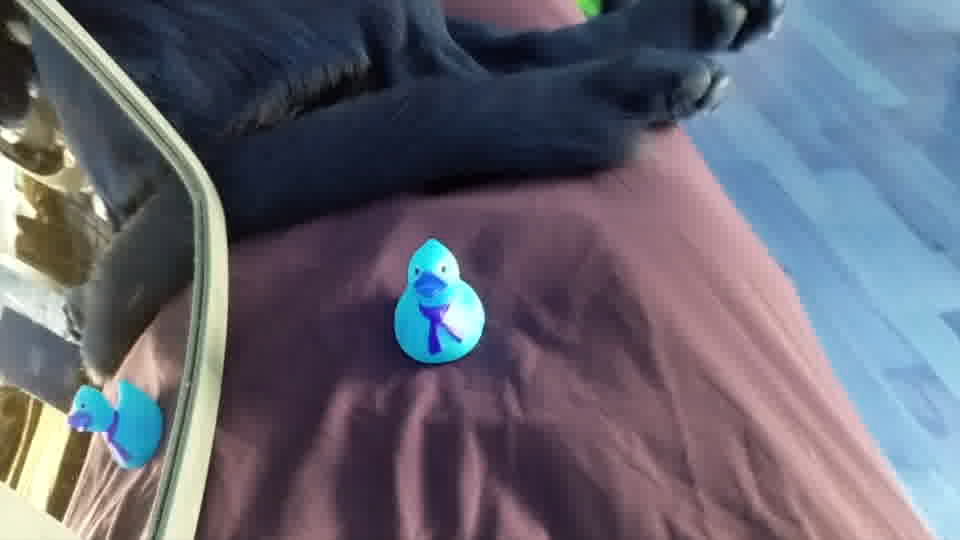

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out24.jpg... Done


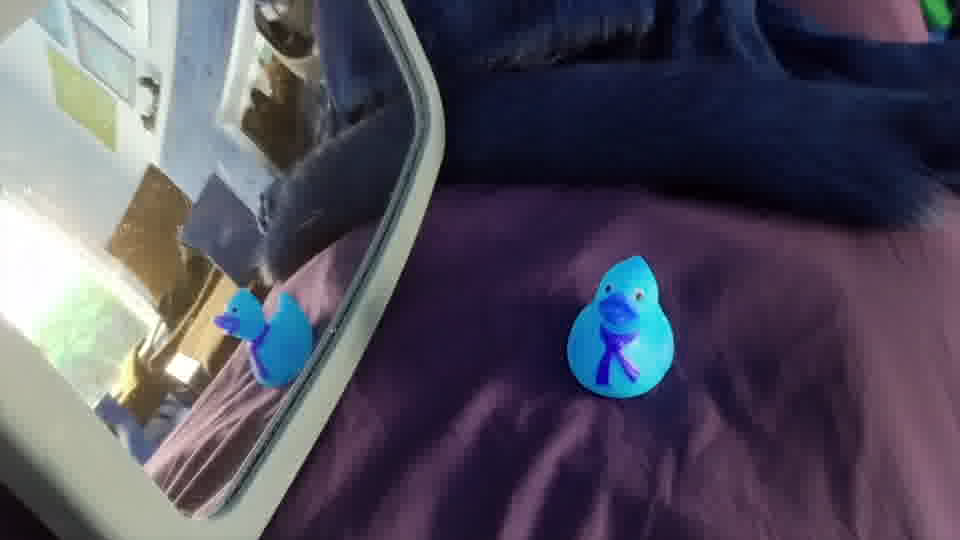

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out25.jpg... Done


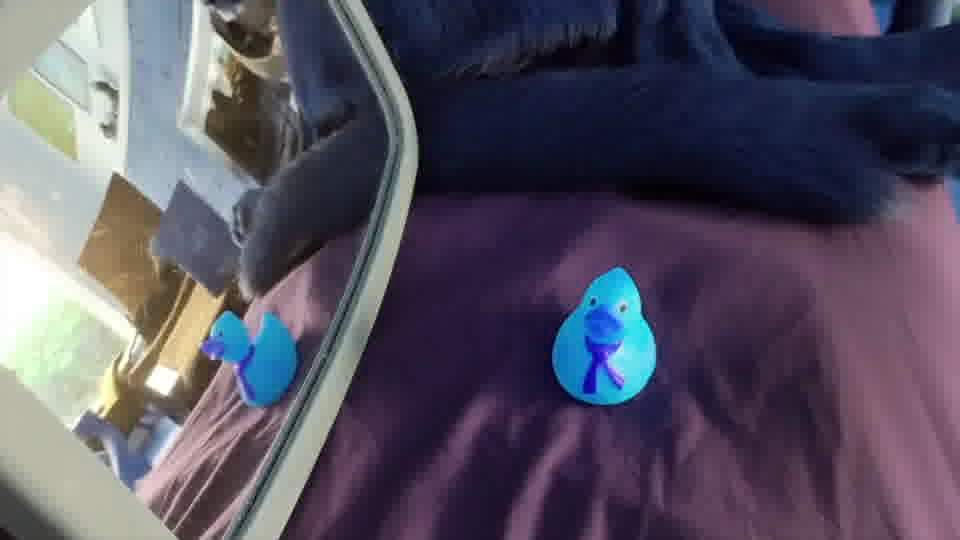

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out17.jpg... Done


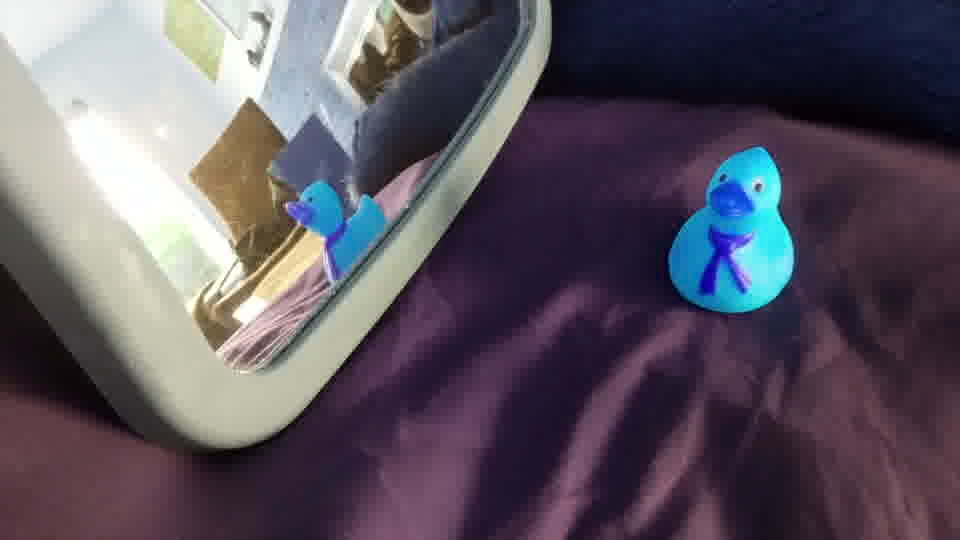

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out22.jpg... Done


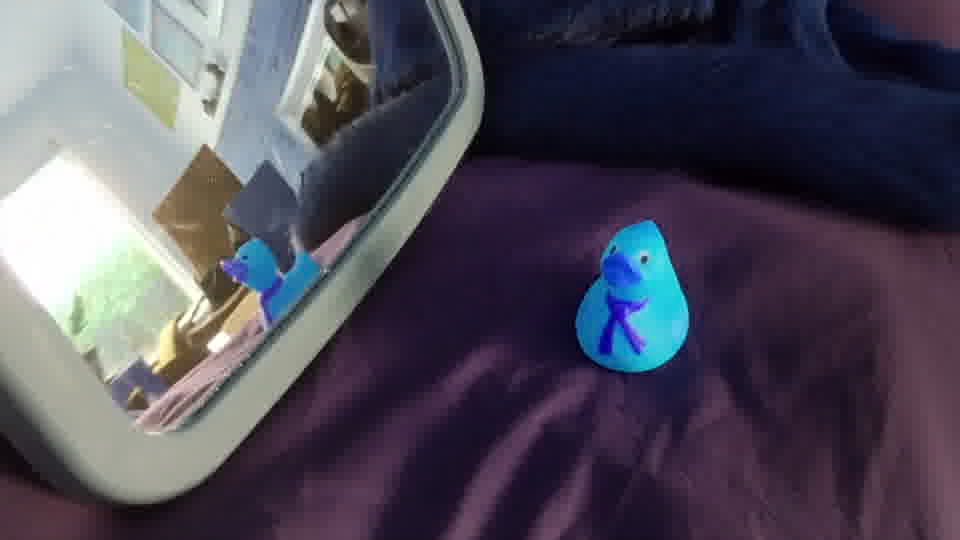

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out1.jpg... Done


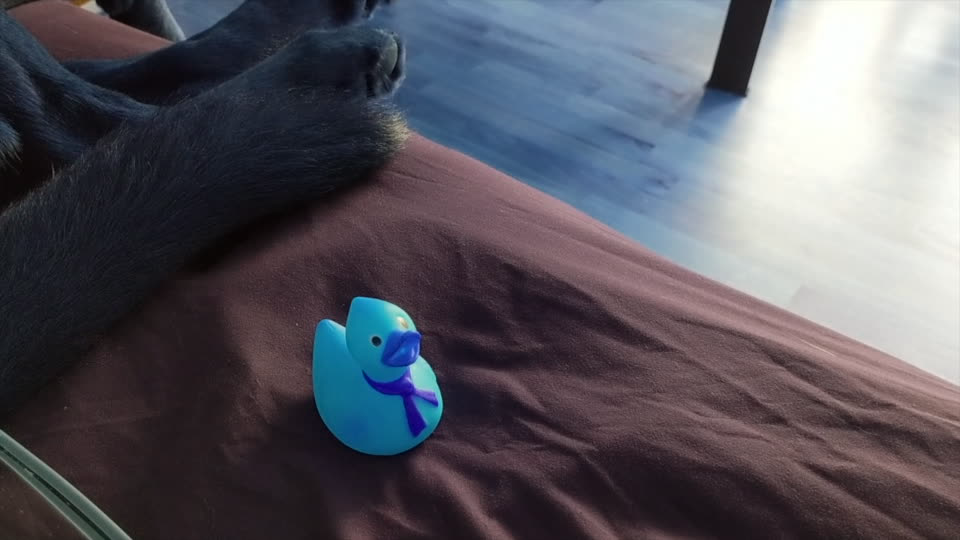

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out14.jpg... Done


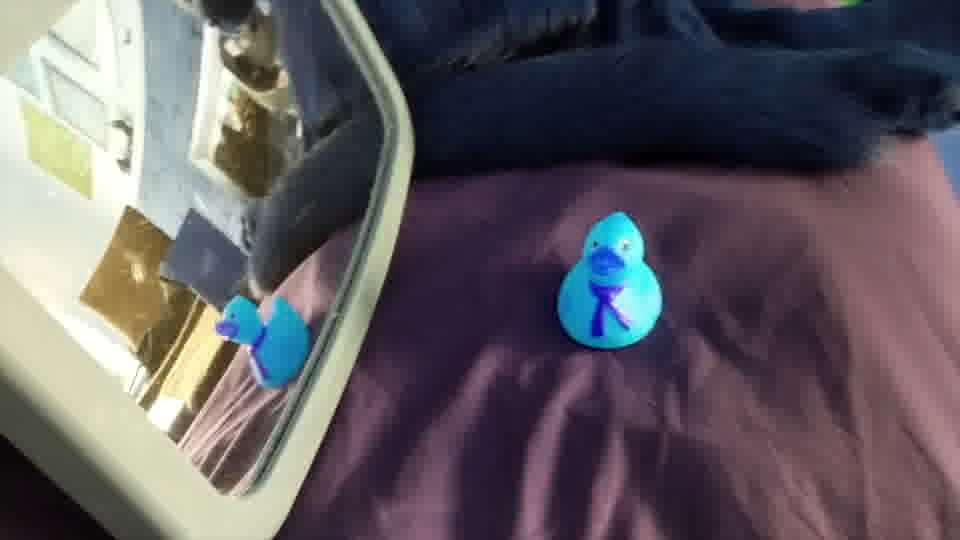

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out13.jpg... Done


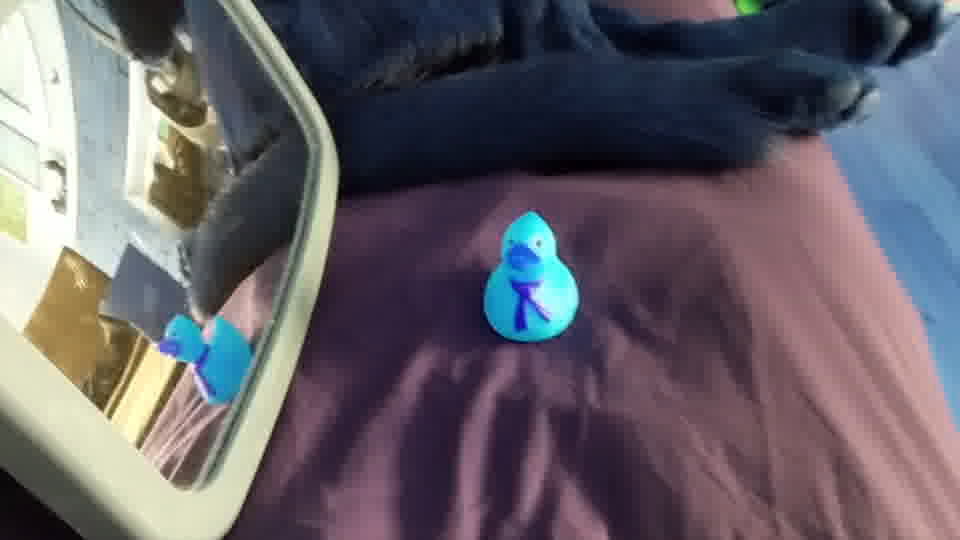

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out20.jpg... Done


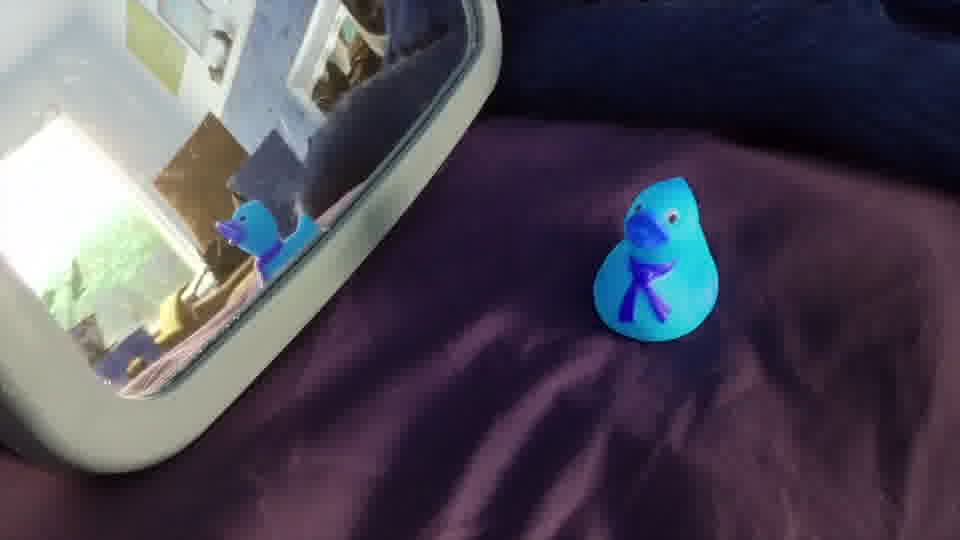

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out23.jpg... Done


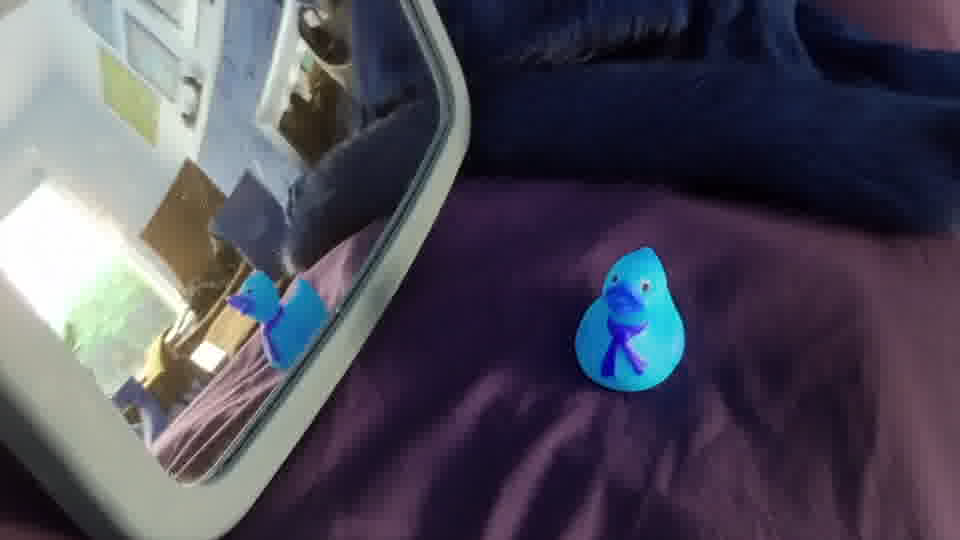

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out12.jpg... Done


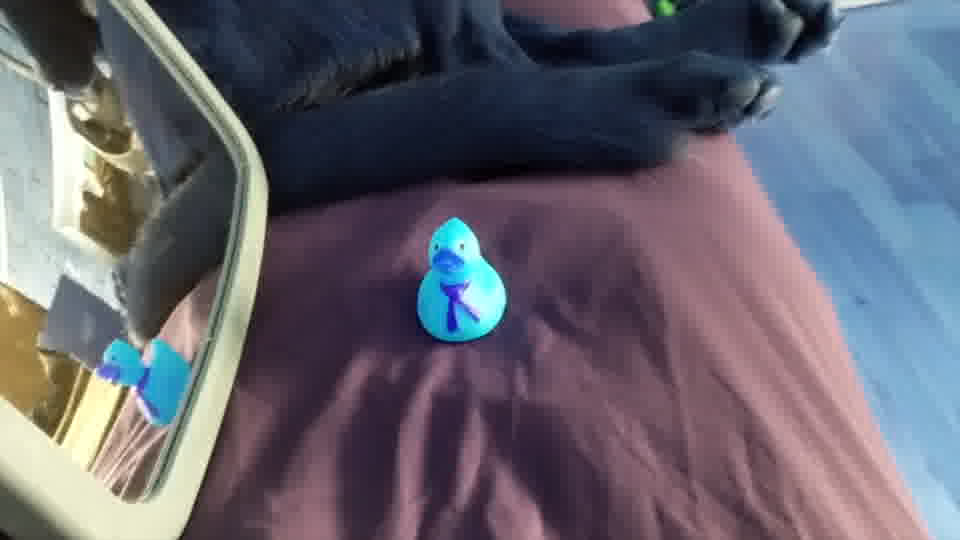

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out45.jpg... Done


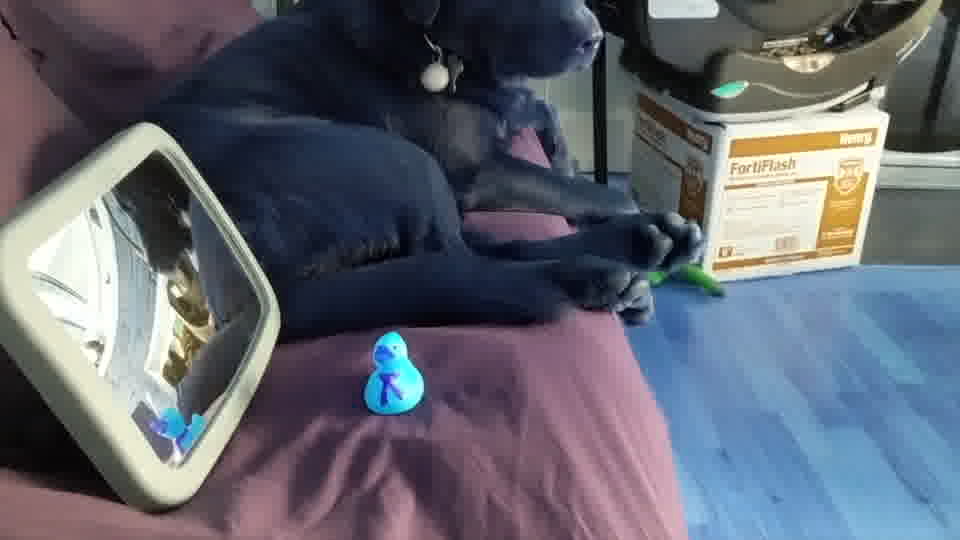

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out28.jpg... Done


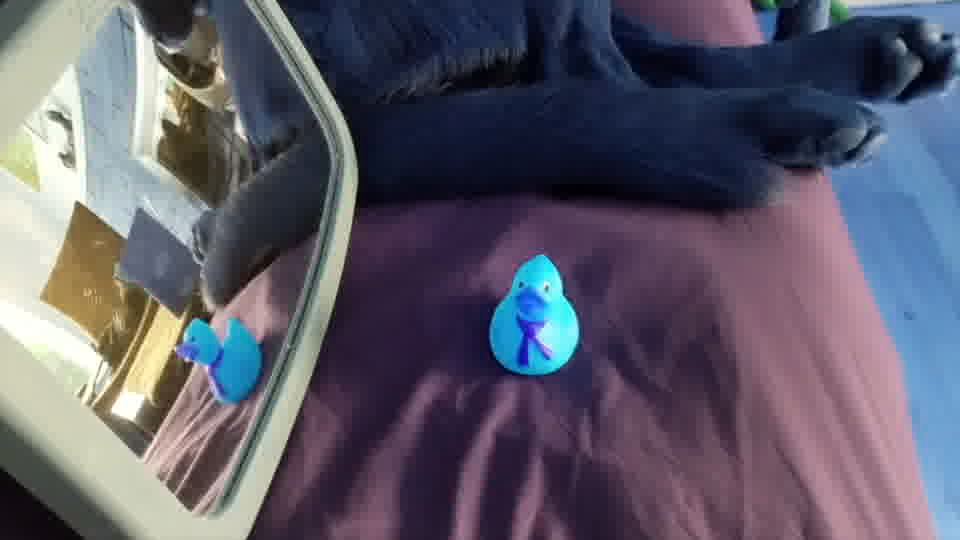

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out42.jpg... Done


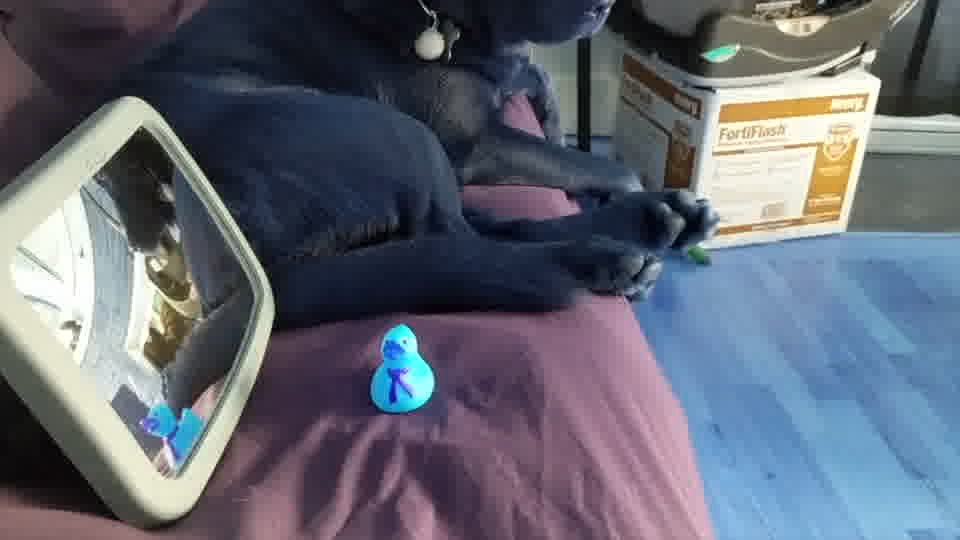

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out40.jpg... Done


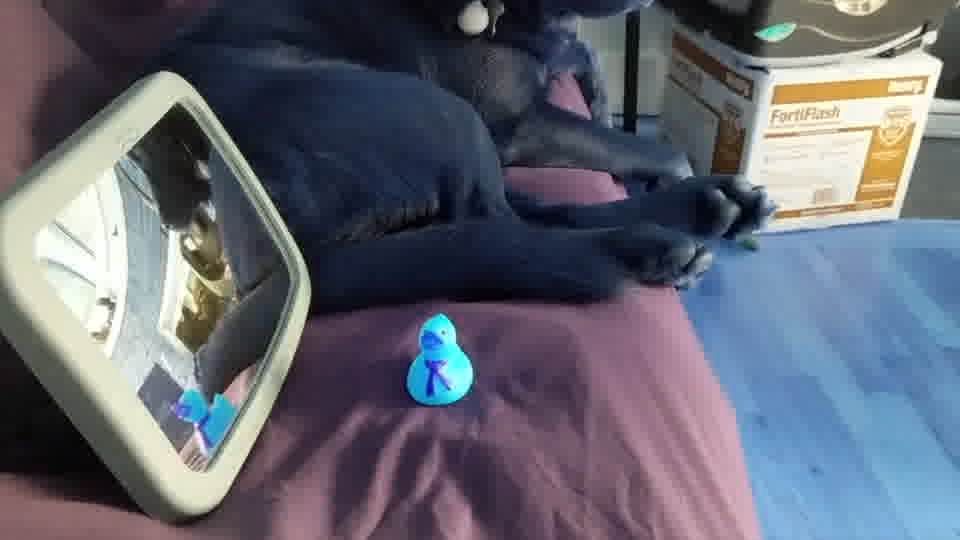

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out34.jpg... Done


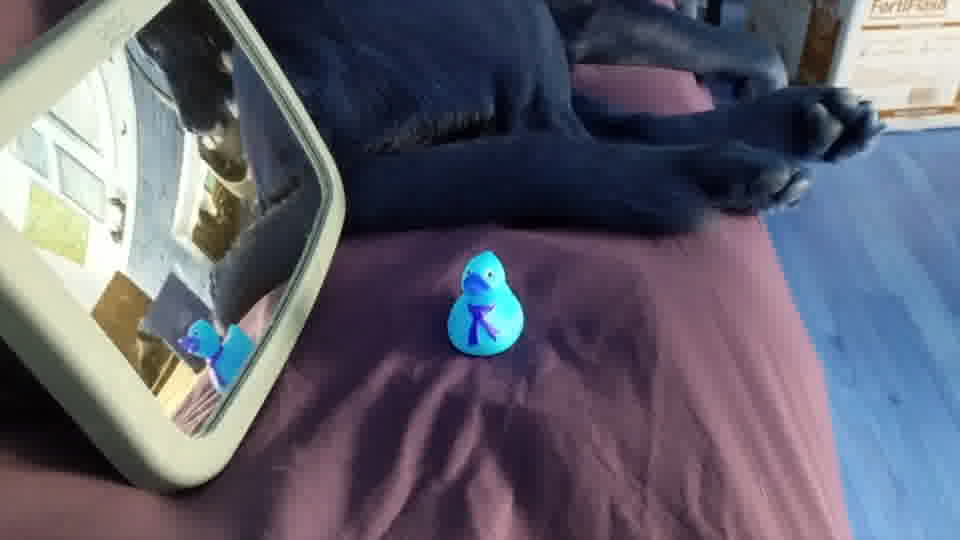

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out30.jpg... Done


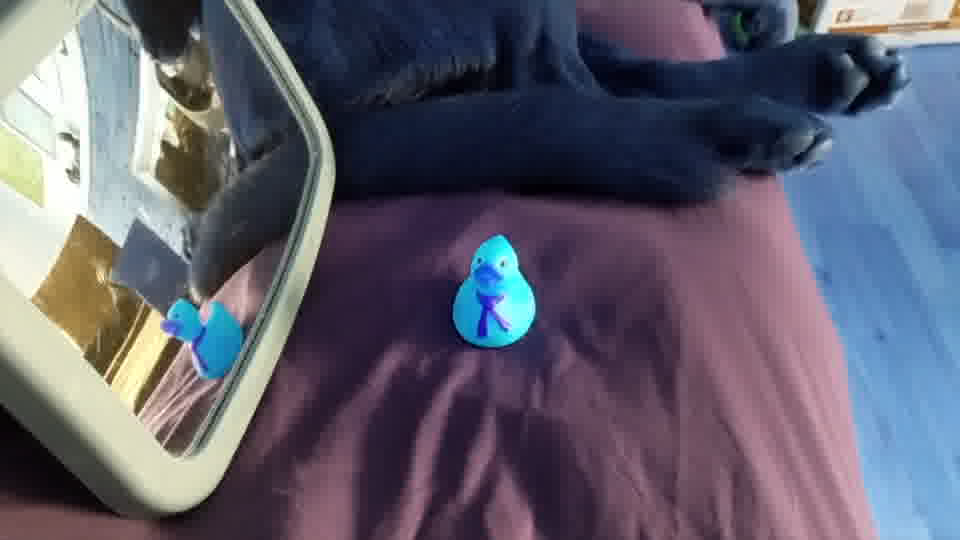

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out36.jpg... Done


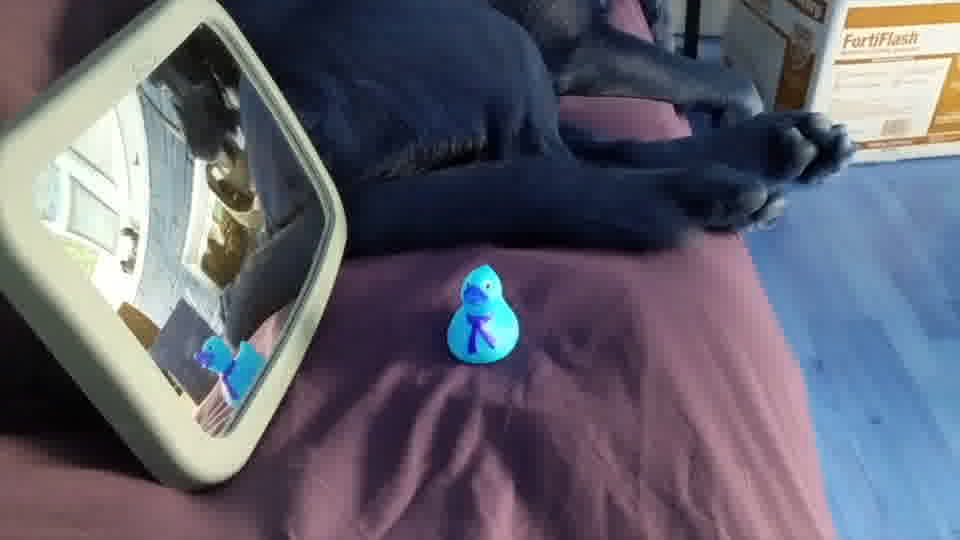

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out32.jpg... Done


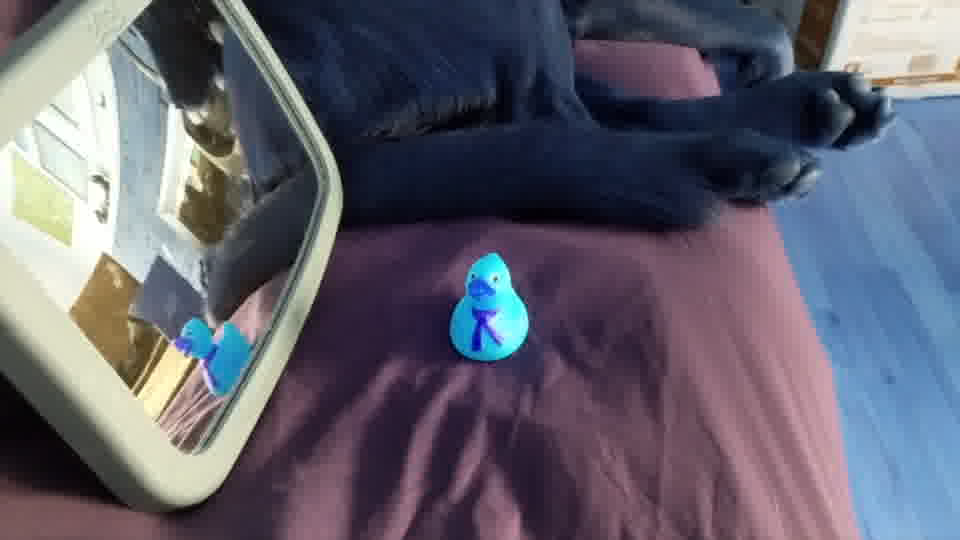

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out48.jpg... Done


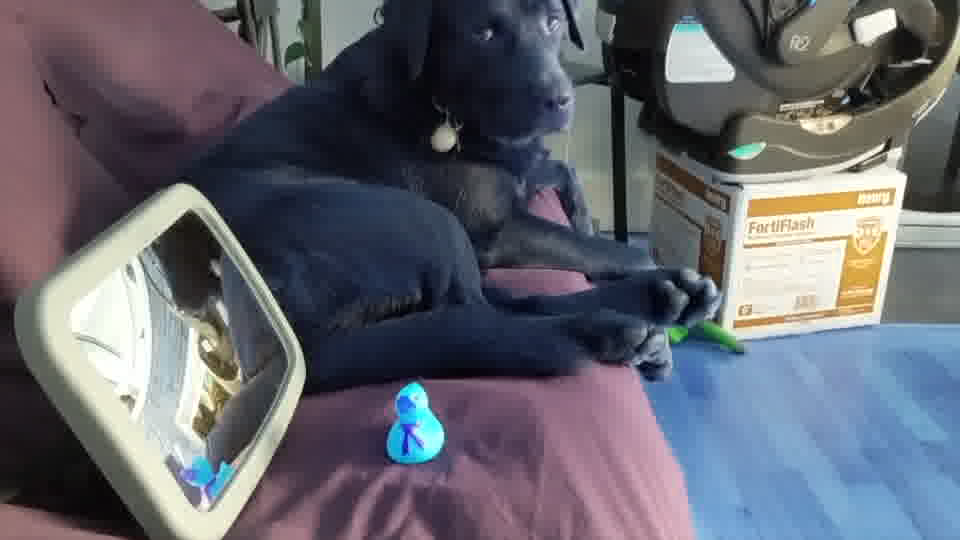

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out47.jpg... Done


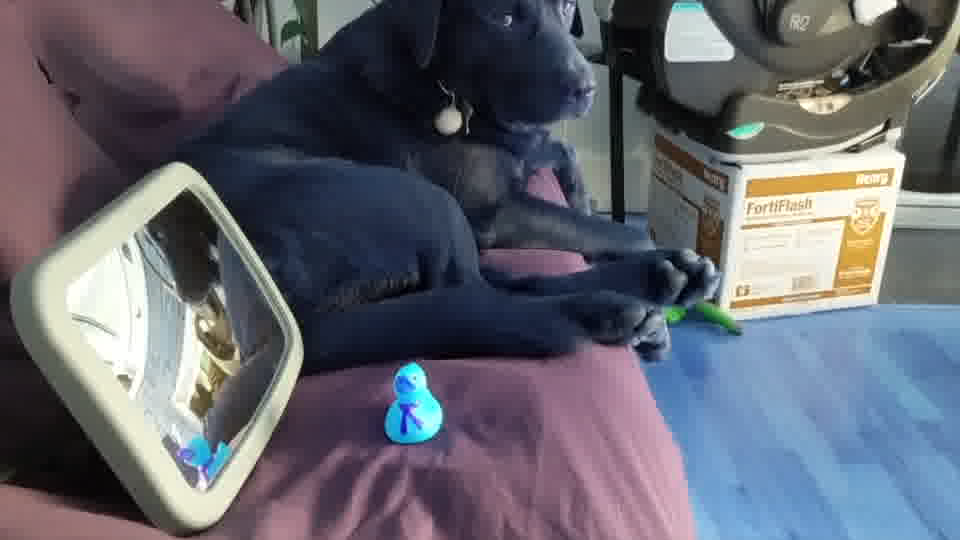

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out27.jpg... Done


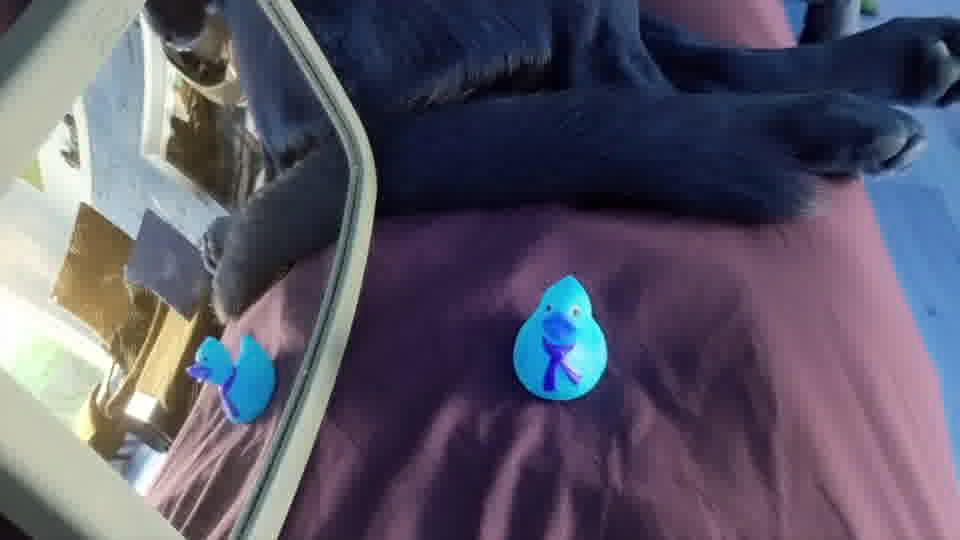

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out41.jpg... Done


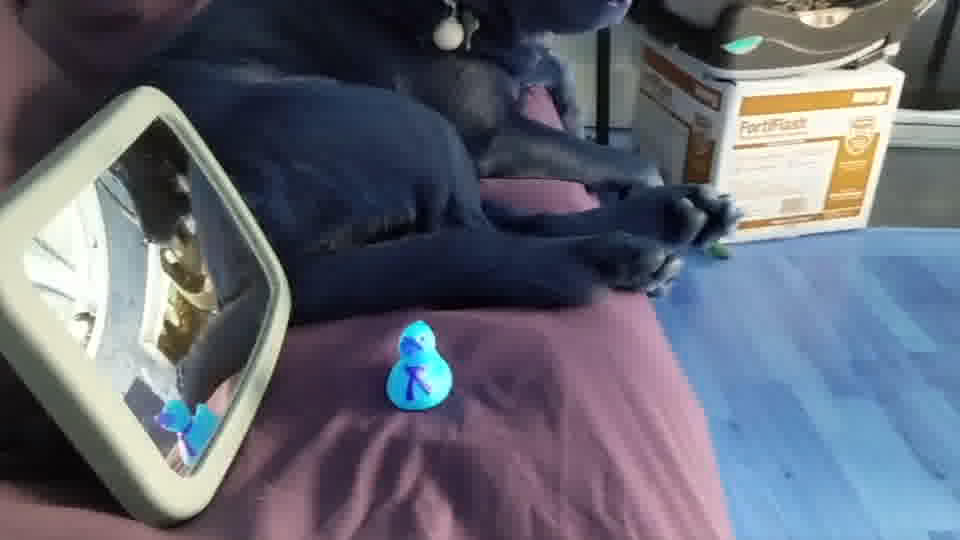

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out46.jpg... Done


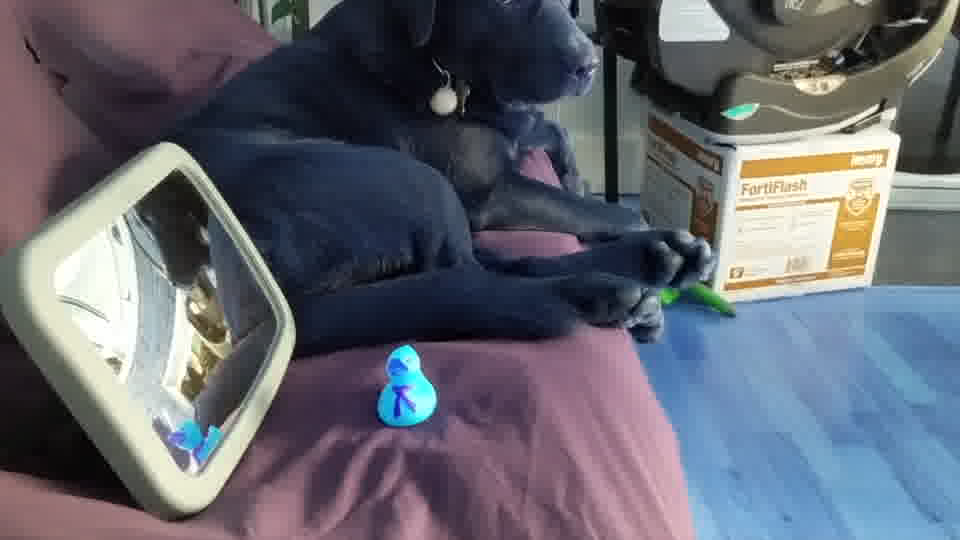

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out8.jpg... Done


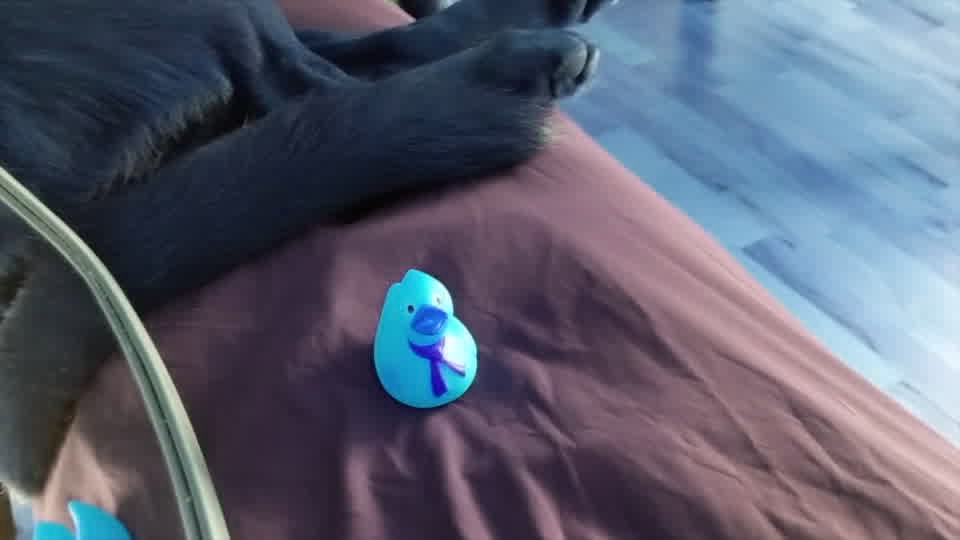

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out31.jpg... Done


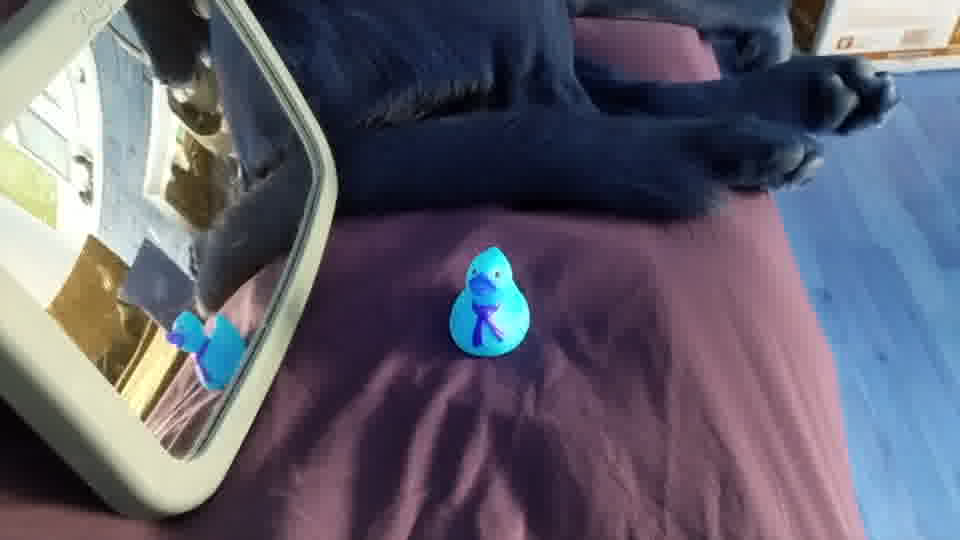

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out49.jpg... Done


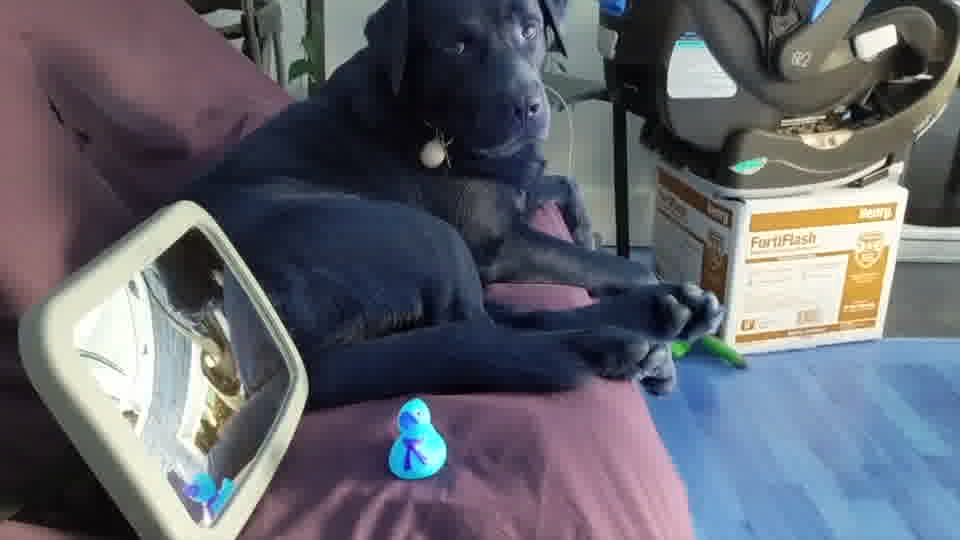

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out6.jpg... Done


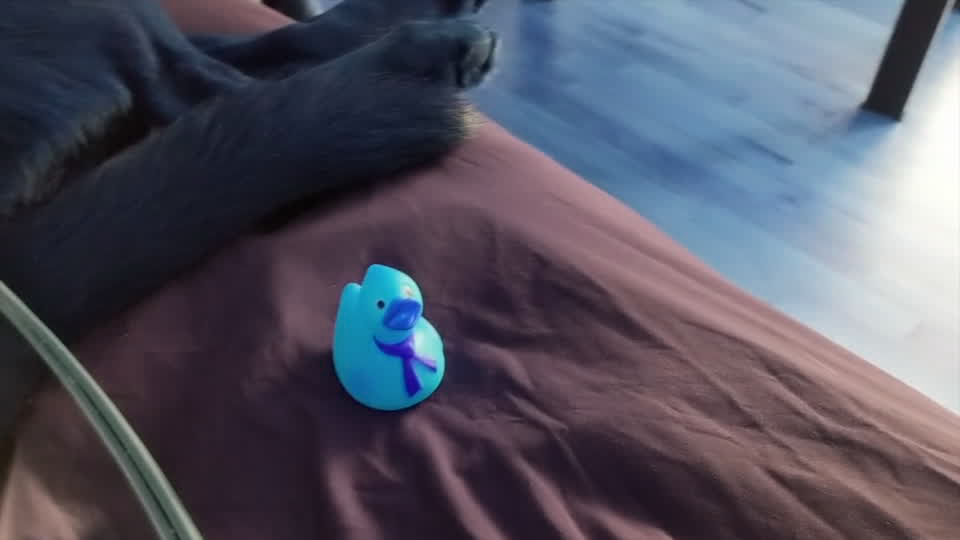

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out4.jpg... Done


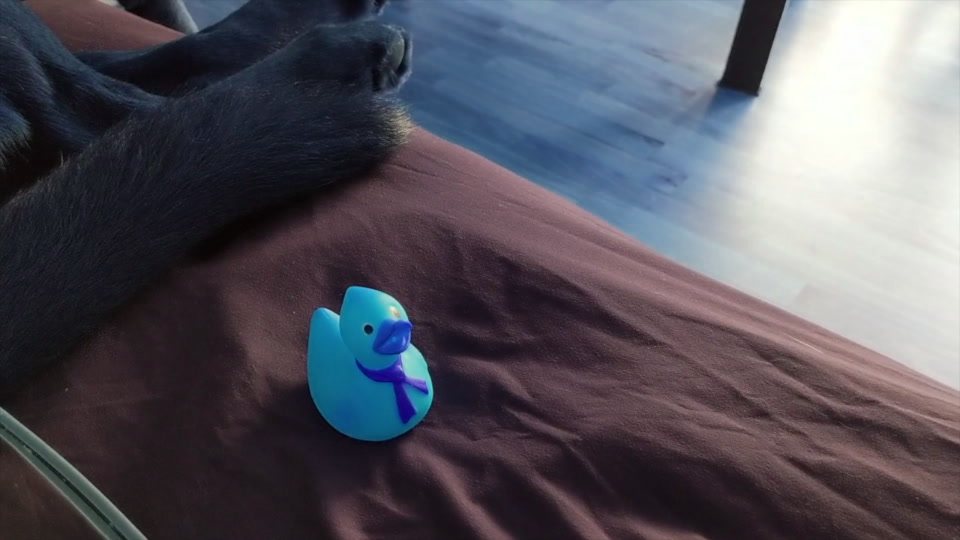

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out5.jpg... Done


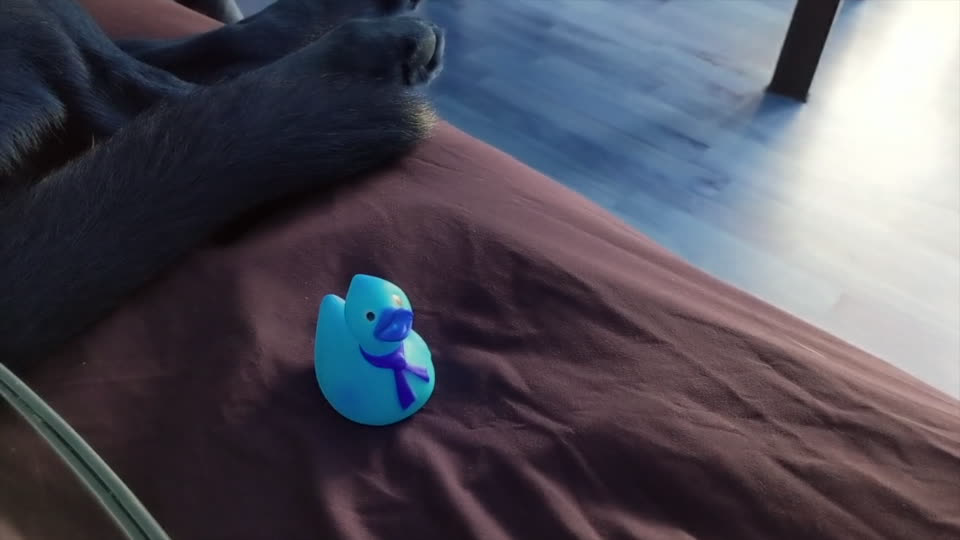

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out38.jpg... Done


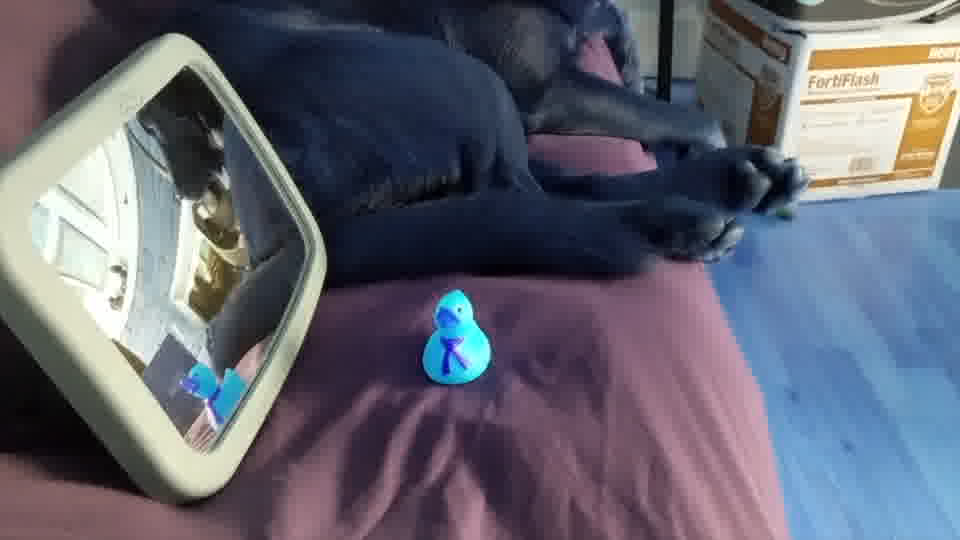

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out33.jpg... Done


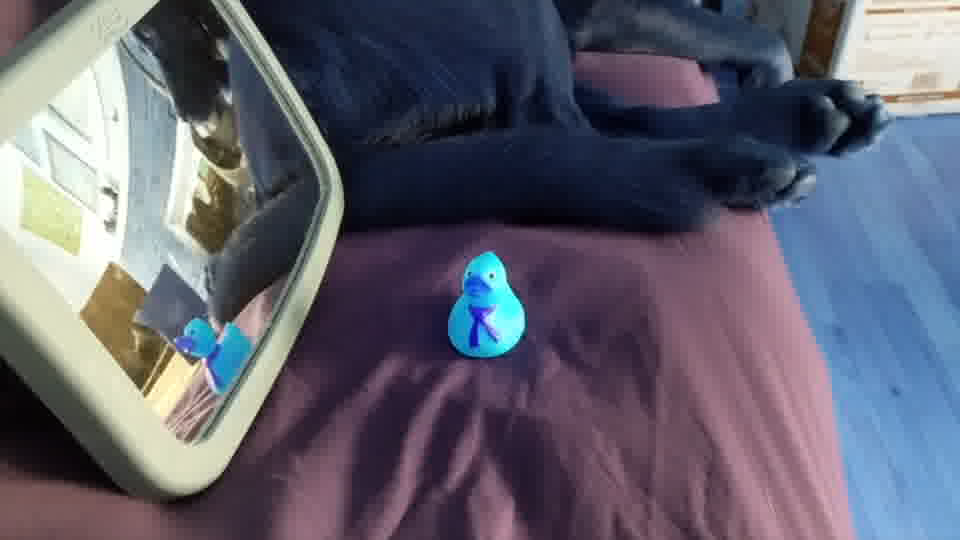

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out29.jpg... Done


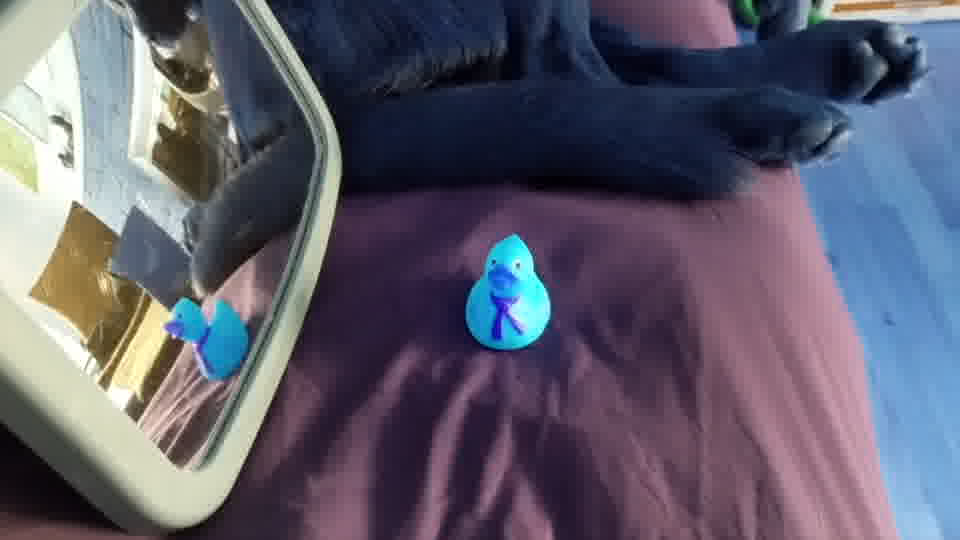

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out9.jpg... Done


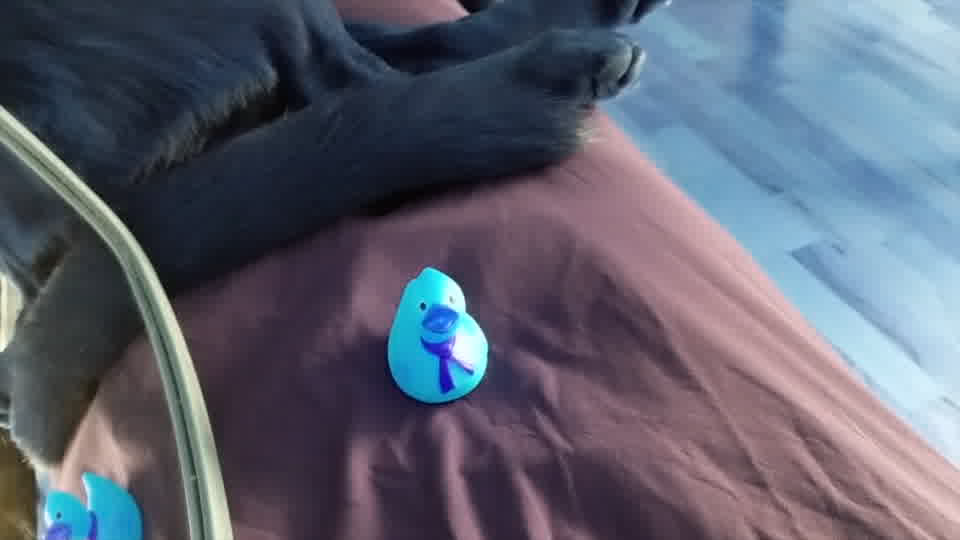

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out39.jpg... Done


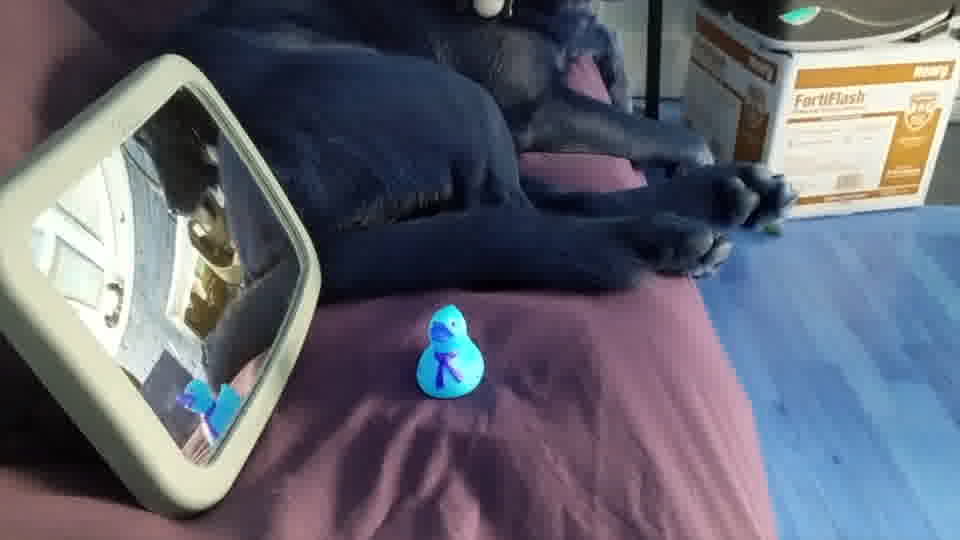

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out37.jpg... Done


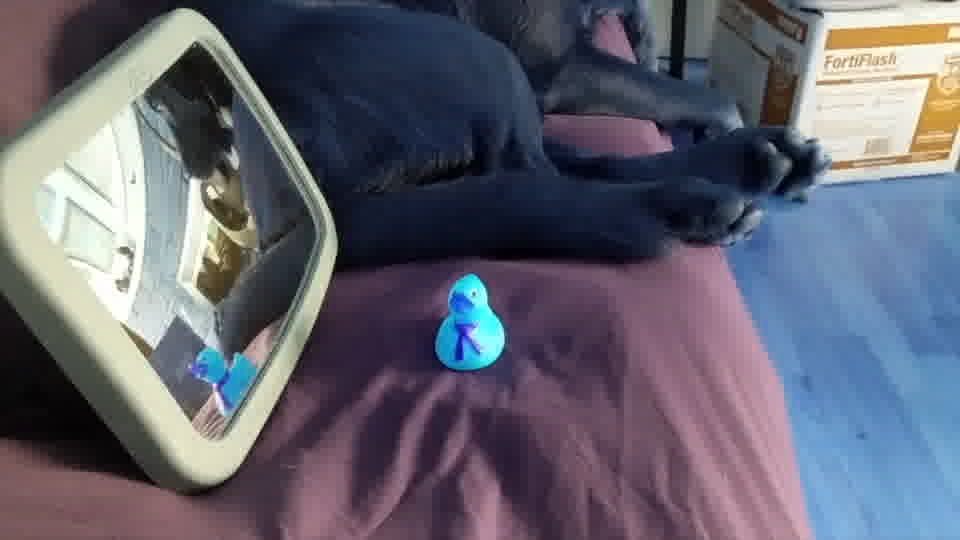

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out35.jpg... Done


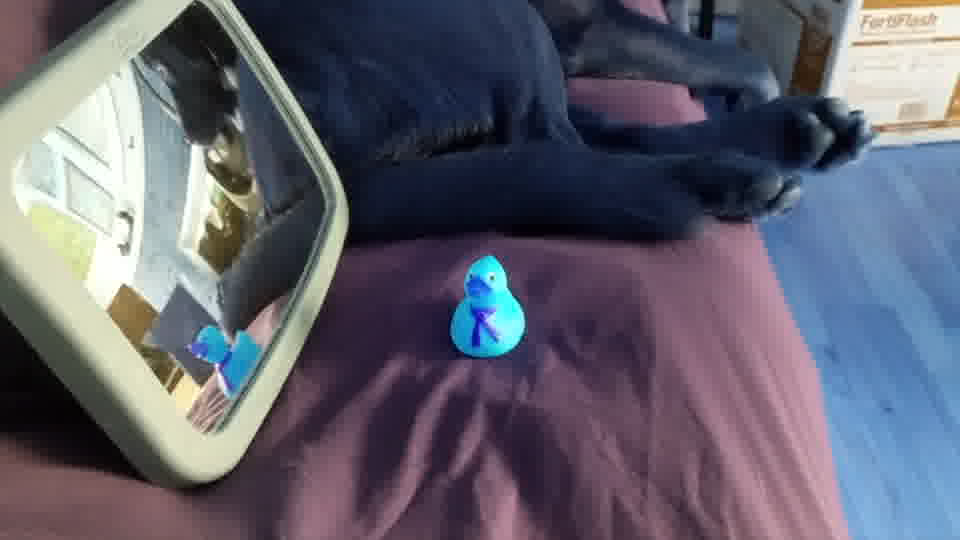

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out44.jpg... Done


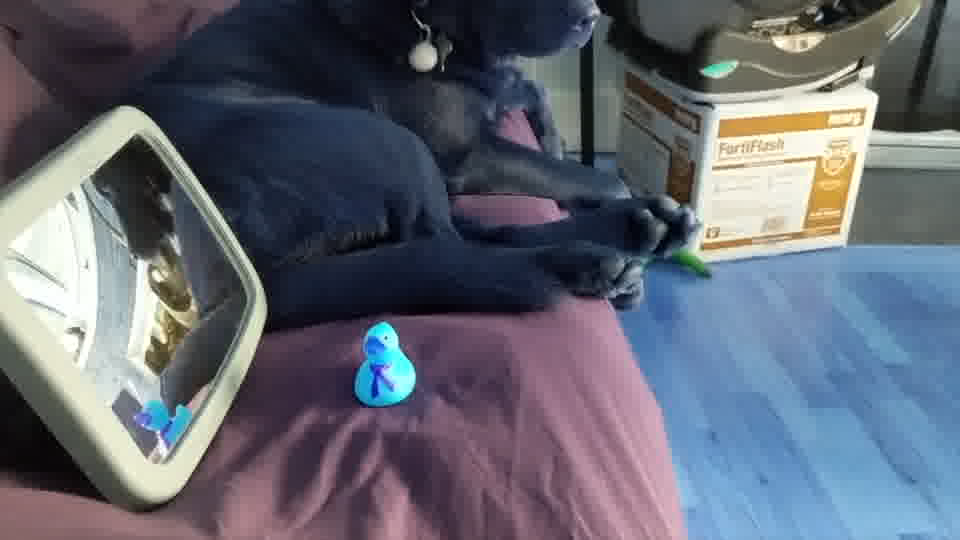

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out3.jpg... Done


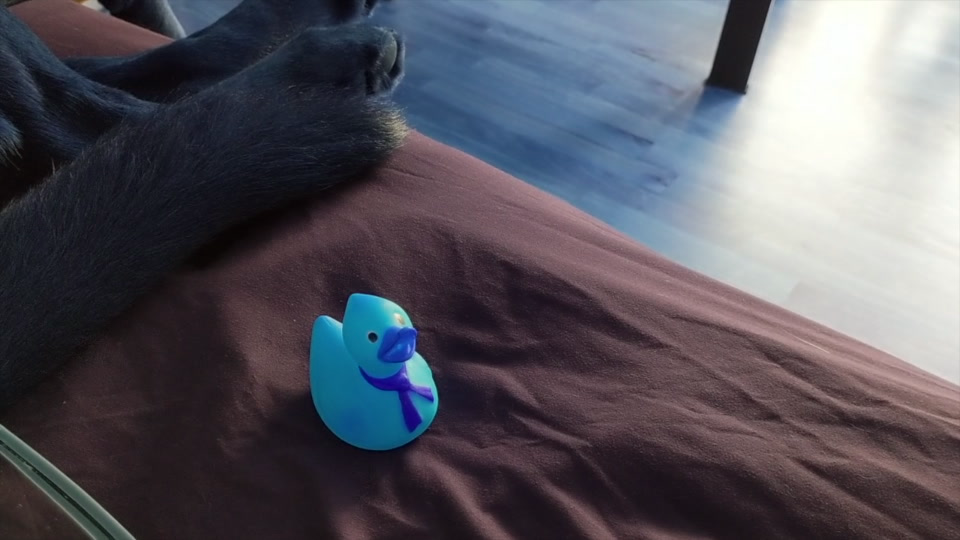

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out43.jpg... Done


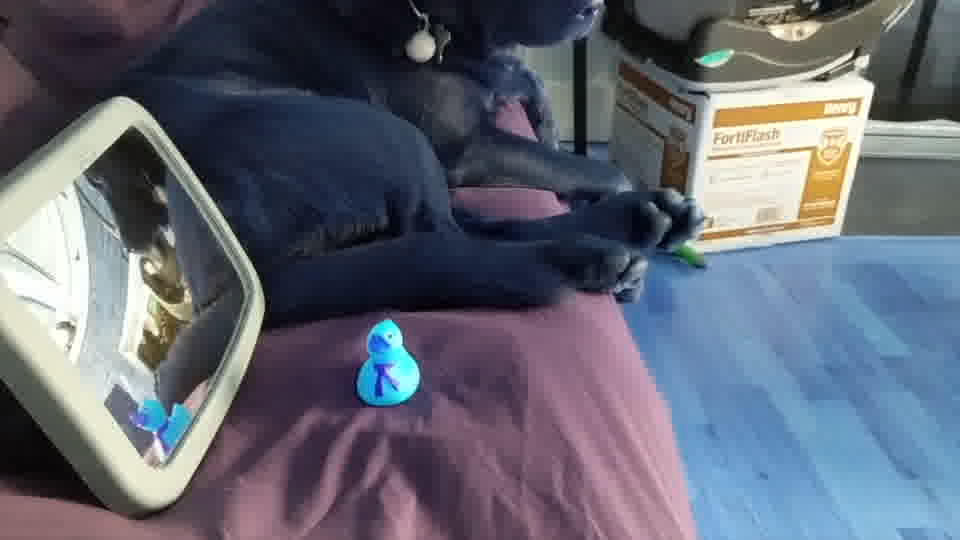

Running inference for /content/drive/MyDrive/TensorFlow/workspace/training_demo/images/test/out7.jpg... Done


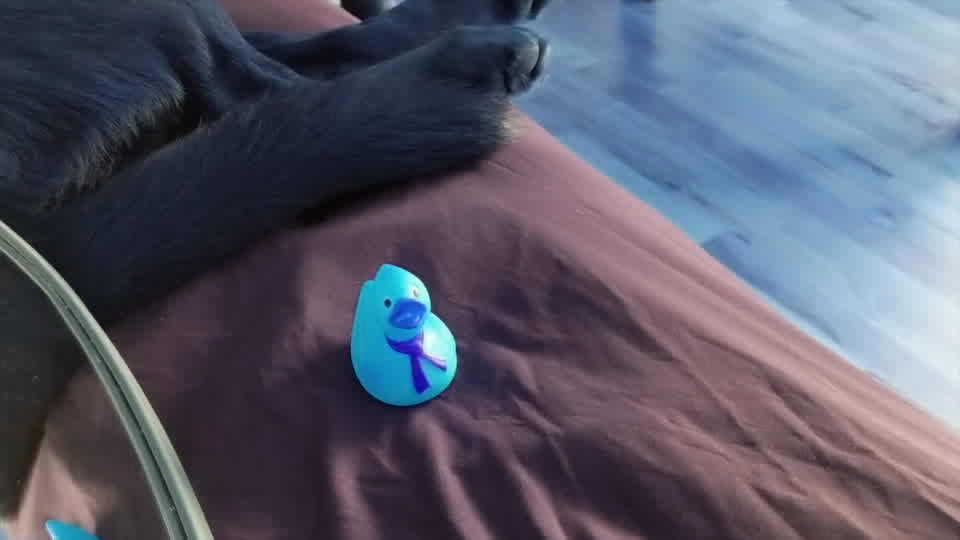

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [ ]:
from google.colab.patches import cv2_imshow
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings

def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path (this can be local or on colossus)

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

for image_path in IMAGE_PATH:

    print('Running inference for {}... '.format(image_path), end='')

    image_np = load_image_into_numpy_array(image_path)

    # Things to try:
    # Flip horizontally
    # image_np = np.fliplr(image_np).copy()

    # Convert image to grayscale
    # image_np = np.tile(
    #     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

    input_tensor = tf.convert_to_tensor(np.expand_dims(image_np, 0), dtype=tf.float32)

    detections = detect_fn(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                  for key, value in detections.items()}
    detections['num_detections'] = num_detections

    # detection_classes should be ints.
    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

    label_id_offset = 1
    image_np_with_detections = image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
            image_np_with_detections,
            detections['detection_boxes'],
            detections['detection_classes']+label_id_offset,
            detections['detection_scores'],
            category_index,
            use_normalized_coordinates=True,
            max_boxes_to_draw=200,
            min_score_thresh=.65,
            agnostic_mode=False)

    print('Done')

    cv2_imshow(image_np_with_detections)
    plt.figure()
  

